<a href="https://colab.research.google.com/github/vaidande/License-Plate-Detector/blob/main/license_plate_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard 68211f72c99915a15855f7b99bf5d93f5631330f

Cloning into 'yolov5'...
remote: Enumerating objects: 8797, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 8797 (delta 18), reused 13 (delta 7), pack-reused 8754
Receiving objects: 100% (8797/8797), 9.38 MiB | 22.02 MiB/s, done.
Resolving deltas: 100% (6105/6105), done.
/content/yolov5
HEAD is now at 68211f7 FROM nvcr.io/nvidia/pytorch:20.10-py3 (#1553)


In [2]:
!pip install -qr requirements.txt
!pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio===0.7.2 -f https://download.pytorch.org/whl/torch_stable.html
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

     |████████████████████████████████| 636 kB 13.0 MB/s 
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████         | 834.1 MB 1.5 MB/s eta 0:03:34tcmalloc: large alloc 1147494400 bytes == 0x55ea86122000 @  0x7f5cc9448615 0x55ea4c30602c 0x55ea4c3e617a 0x55ea4c308e4d 0x55ea4c3fac0d 0x55ea4c37d0d8 0x55ea4c377c35 0x55ea4c30a73a 0x55ea4c37cf40 0x55ea4c377c35 0x55ea4c30a73a 0x55ea4c37993b 0x55ea4c3fba56 0x55ea4c378fb3 0x55ea4c3fba56 0x55ea4c378fb3 0x55ea4c3fba56 0x55ea4c378fb3 0x55ea4c30ab99 0x55ea4c34de79 0x55ea4c3097b2 0x55ea4c37ce65 0x55ea4c377c35 0x55ea4c30a73a 0x55ea4c37993b 0x55ea4c377c35 0x55ea4c30a73a 0x55ea4c378b0e 0x55ea4c30a65a 0x55ea4c378d67 0x55ea4c377c35
     |█████████████████████████████▏  | 1055.7 MB 1.3 MB/s eta 0:01:16tcmalloc: large alloc 1434370048 bytes == 0x55eaca778000 @  0x7f5cc9448615 0x55ea4c30602c 0x55ea4c3e617a 0x55ea4c308e4d 0x55ea4c3fac0d 0x55ea4c37d0d8 0x55ea4c377c35 0x55ea4c30a73a 0x55ea4c37cf40 0x55ea4c377c35

In [3]:
!curl -L "https://app.roboflow.com/ds/A87rYk7OjI?key=C3YDktV8u1" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   888  100   888    0     0   1252      0 --:--:-- --:--:-- --:--:--  1252
100 16.3M  100 16.3M    0     0  6603k      0  0:00:02  0:00:02 --:--:-- 24.2M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: train/
   creating: train/images/
 extracting: train/images/0073797c-a755-4972-b76b-8ef2b31d44ab___new_IMG_20160315_071740-jpg_jpeg.rf.c4a65f743abc724c27039f70983b6fd7.jpg  
 extracting: train/images/00b42b2c-f193-4863-b92c-0245cbc816da___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-Petrol-Review-Images-Black-Front-Angle.rf.1d23ac0f4fae7a0972de8bbf8c9ce7b8.jpg  
 extracting: train/images/00b42b2c-f193-4863-b92c-0245cbc816da___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-Petrol-Review-Images-Black-Front-Angle_jpg.rf

In [11]:
%cat data.yaml

train: train/images
val: valid/images

nc: 1
names: ['license_plate']

In [5]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [7]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [8]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [12]:
%%time
%cd /content/yolov5
!python train.py --img 416 --batch 16 --epochs 200 --data '/content/yolov5/data.yaml' --cfg '/content/yolov5/models/custom_yolov5s.yaml' --weights '' --name yolov5s_results

/content/yolov5
Using torch 1.7.1+cu110 CUDA:0 (Tesla K80, 11441MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=False, cfg='/content/yolov5/models/custom_yolov5s.yaml', data='/content/yolov5/data.yaml', device='', epochs=200, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], local_rank=-1, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/yolov5s_results2', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
2021-08-12 12:00:44.021831: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0,

In [13]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [21]:
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source valid/images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='valid/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5s_results2/weights/best.pt'])
Using torch 1.7.1+cu110 CUDA:0 (Tesla K80, 11441MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
image 1/51 /content/yolov5/valid/images/074d85b8-42ec-4d17-9b8e-9e51ae060243___hqdefault_jpg.rf.726a97b8cff9c1dcc9fe0bdee081c11d.jpg: 416x416 1 license_plates, Done. (0.033s)
image 2/51 /content/yolov5/valid/images/0a0d1748-48cd-4114-90cb-b5baf0b3cbe4___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_147274518_15141875973_large_jpg.rf.472970bbf09ba265ec1fab5f45de5acd.jpg: 416x416 1 license_plates, Done. (0.032s)
image 3/51 /content/yolov5/valid/images/0a720df9-e4ef-4e44-8c13-b39b9be8444d___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-6.rf.af3

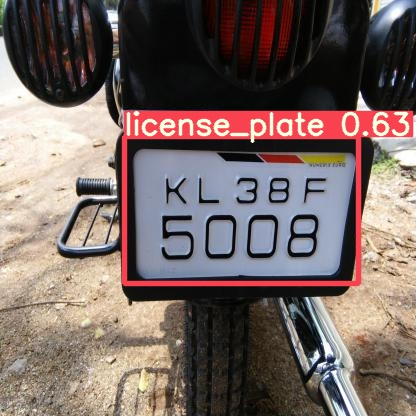

'/content/yolov5/runs/detect/exp3/206c95ff-83b8-4273-b105-6637bf9a3038___numerix-number-plates-thodupuzha-idukki-number-plate-dealers-1lhwiga-jpg_jpeg.rf.82245f5117923210aa6743ba135d6029.jpg'

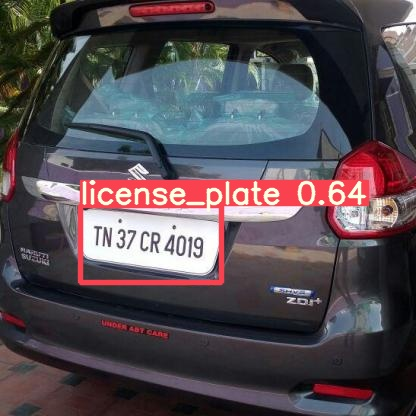

'/content/yolov5/runs/detect/exp3/23d775eb-842f-4f57-ad7a-affafa21660a___215453-new-2016-maruti-ertiga-granite-grey-zdi-shvs-highway-champion-img_8168-jpg_jpeg.rf.8800bce186e20c58847e5db8c8c41ce7.jpg'

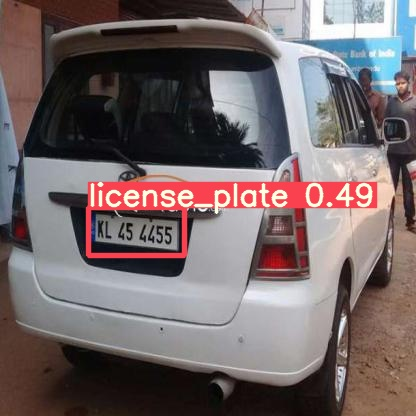

'/content/yolov5/runs/detect/exp3/b5b41a4b-8913-4af6-9419-ac6398d266b0___161893107_2_1000x700_innava-with-fancy-number-upload-photos-jpg_jpeg.rf.fc77fe44e836ee92509d6530a11ae892.jpg'

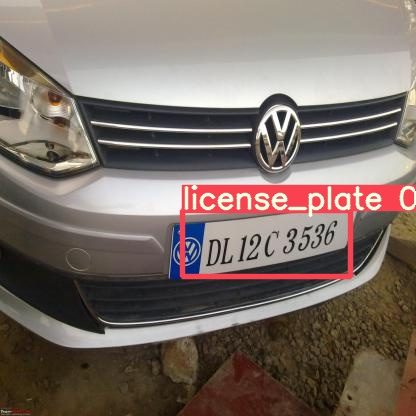

'/content/yolov5/runs/detect/exp3/79094948-25d3-418e-86fc-3c2d62917f62___513039-volkswagen-vento-test-drive-review-06032011612_jpg.rf.bd5fcb60083c607d9e9b5a5224daea24.jpg'

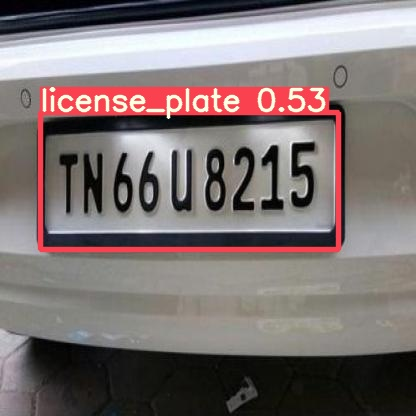

'/content/yolov5/runs/detect/exp3/125b5cda-9691-47aa-8e57-f6d8a8537d83___fancy_number_plates_in_india_jpg.rf.fd964fcbebc8630cf521e854c3362c37.jpg'

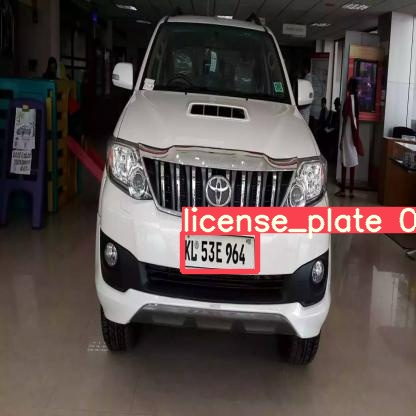

'/content/yolov5/runs/detect/exp3/684f079f-6085-420c-8e4e-e1aed270fc05___Toyota-Fortuner-Number-Plates-Design-jpg_jpeg.rf.d308caed70033853ff887c57ee33052c.jpg'

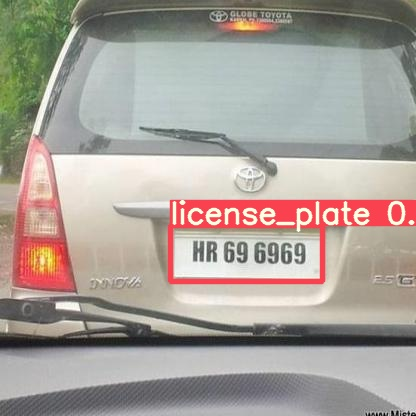

'/content/yolov5/runs/detect/exp3/8b9e7112-9149-48fb-b8e8-c3e89cce5af0___1074650_10201043987997310_227646612_o_jpg.rf.028599187a0d45631b91c4ab81e2f871.jpg'

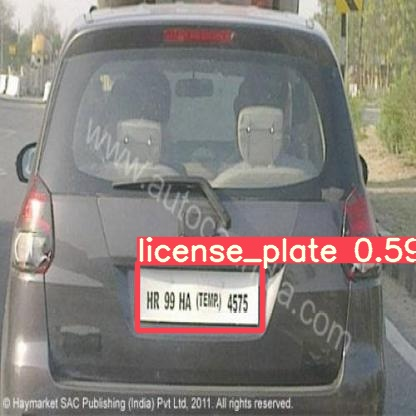

'/content/yolov5/runs/detect/exp3/c2feb2b7-fbb3-4e1e-ad48-cc8112a1ab3f___Maruti_R3_On_Test_jpg.rf.e54d36997b89a80976c7f7fded5506d7.jpg'

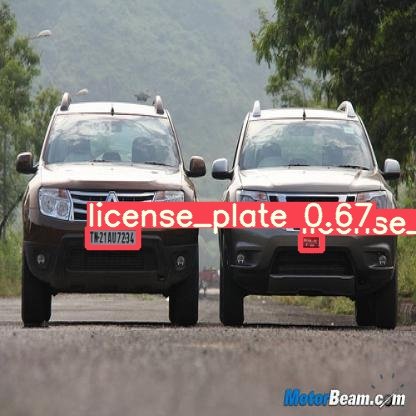

'/content/yolov5/runs/detect/exp3/59a29a85-30f5-469e-a6c2-e1af171f151c___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_10187746494_417a40a489_jpg.rf.10d14848cd8439021c18ed0a78d8e1c1.jpg'

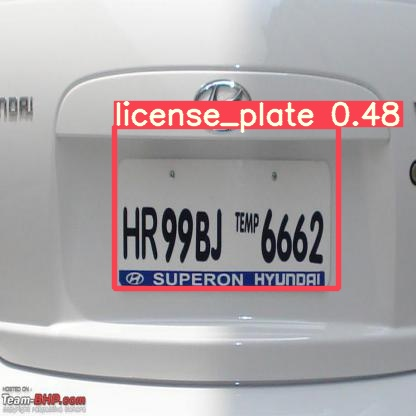

'/content/yolov5/runs/detect/exp3/7c8229d7-7e37-41a6-9262-d5da278c8d8e___139379d1243147524-ok-have-dealers-name-number-plate-1-jpg_jpeg.rf.5a90a1342393bb9fbfbff21d16e276c0.jpg'

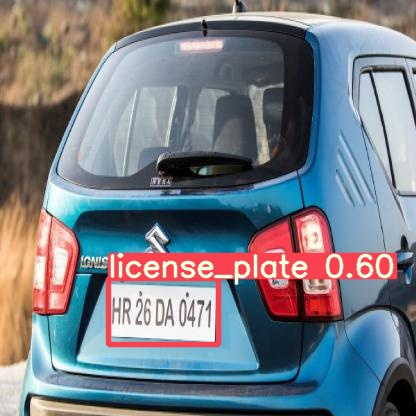

'/content/yolov5/runs/detect/exp3/377b225b-e978-4e7c-8e5e-f10d8effc336___Maruti-Suzuki-Ignis-Rear-view-94486-jpg_jpeg.rf.f336674373954540250c3e1639f66a87.jpg'

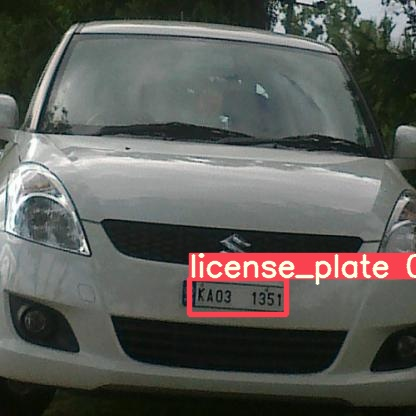

'/content/yolov5/runs/detect/exp3/52b45060-9645-47c7-882d-b69a5bf07eff___1006372d1351343820-my-new-maruti-swift-zxi-21102012241-jpg_jpeg.rf.2ce8a2f156a375d5e12b91c321e38993.jpg'

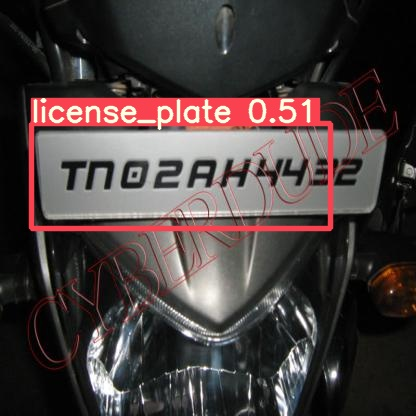

'/content/yolov5/runs/detect/exp3/5181fd64-3d1b-414d-b405-acb4c535c944___FZ163-jpg_jpeg.rf.c60766c0cd539afc73356a2b9c2a61a7.jpg'

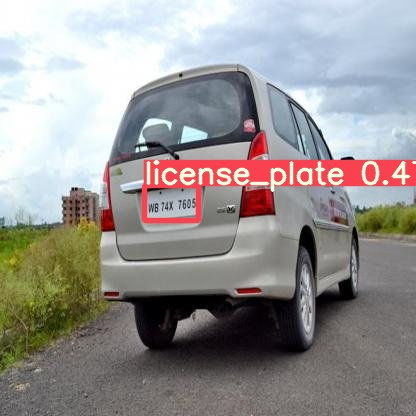

'/content/yolov5/runs/detect/exp3/88294212-f11c-46a7-a91a-04c9da19efa6___DSC_8221-L_jpg.rf.1a1ce21d4e20f47df878247df86d6f6b.jpg'

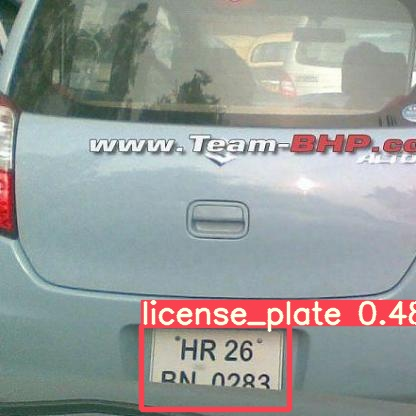

'/content/yolov5/runs/detect/exp3/50dfc8ce-e3e0-4856-aeba-2dcdf0fc2bec___Alto-Eco-India-rear-2-jpg_jpeg.rf.c2d8893e737d5eed3a0c7d348f6b5f5d.jpg'

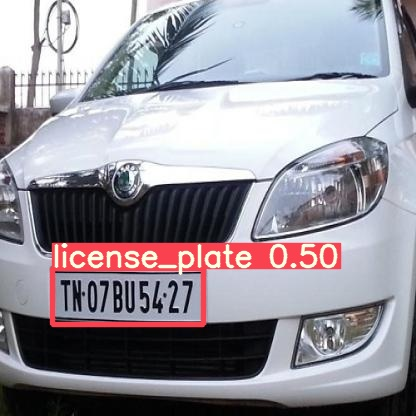

'/content/yolov5/runs/detect/exp3/9ea92991-8fdf-4b46-aea1-bf08ecff247c___new_1107433d1373284570-my-modded-skoda-rapid-now-166-bhp-351-nm-119-whp-per-tonne-hdr_00005_normal-jpg_jpeg.rf.34aae1c05761339569dc127f5eadb860.jpg'

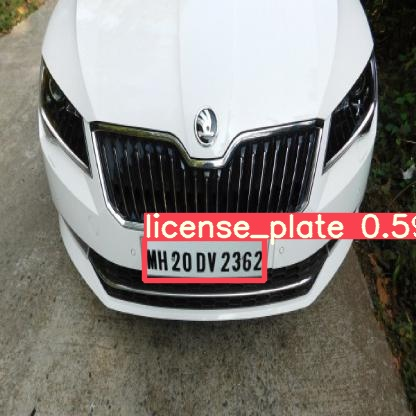

'/content/yolov5/runs/detect/exp3/f9e27b82-9e65-44ba-bf9a-b3ced8901937___Skoda-Superb-Exterior-deadfront-69204-jpg_jpeg.rf.6b02906172e2c8648c67b9d67b00a9bb.jpg'

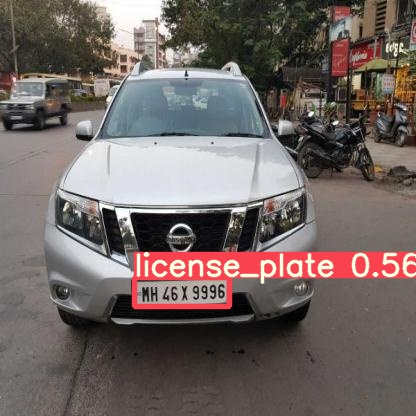

'/content/yolov5/runs/detect/exp3/0a0d1748-48cd-4114-90cb-b5baf0b3cbe4___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_147274518_15141875973_large_jpg.rf.472970bbf09ba265ec1fab5f45de5acd.jpg'

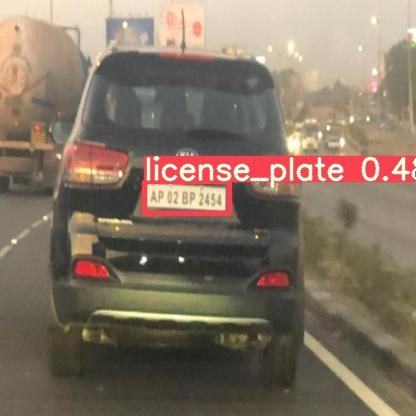

'/content/yolov5/runs/detect/exp3/8c4371ee-a997-4b21-82c4-cb5e767c4d06___kia-sorento-spied-in-India_jpg.rf.1b9f6dd8d88f936a8f761f4b8ad49fb2.jpg'

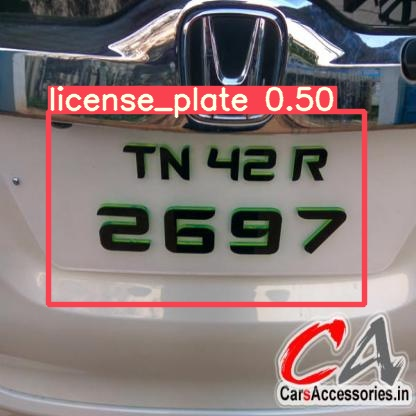

'/content/yolov5/runs/detect/exp3/7070d6ac-5425-4d33-a78e-a48c62d0fac5___Honda-Jazz-Number-Plate-Designs-jpg_jpeg.rf.431d48e8d065ee6b369ff1915168529c.jpg'

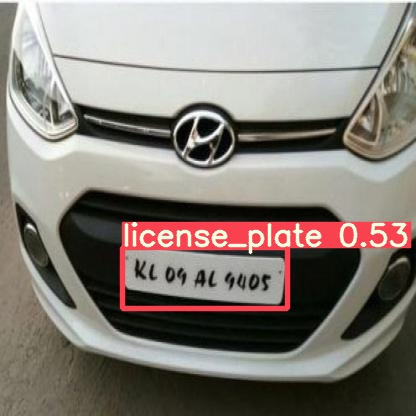

'/content/yolov5/runs/detect/exp3/22dc6b5f-ff5d-4bb4-beb2-0f5fd9e75787___i10_Latest_Acrylic_Number_Plate_jpg.rf.aa64dd84f050397c4a388b5e7fd932c4.jpg'

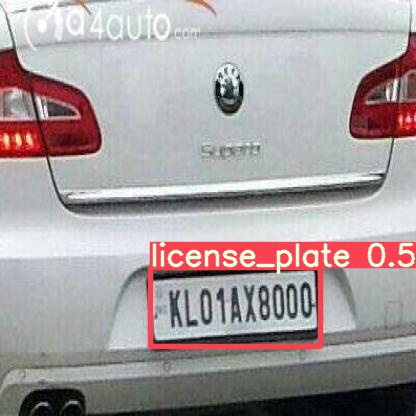

'/content/yolov5/runs/detect/exp3/4434b404-dd10-4150-b226-b76b6ef95e43___new_224489195_8_1000x700_skoda-superb-2010-_jpg.rf.340e4e5aa77575bb85149d886ae4b67f.jpg'

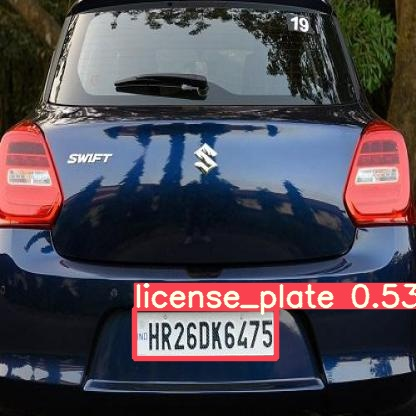

'/content/yolov5/runs/detect/exp3/e53076d3-c3b7-47b8-8c63-30a08b8ad983___40213__Maruti_Suzuki_Swift--016_JPG.rf.171ee14456e581c50a4ac65aef4ea60e.jpg'

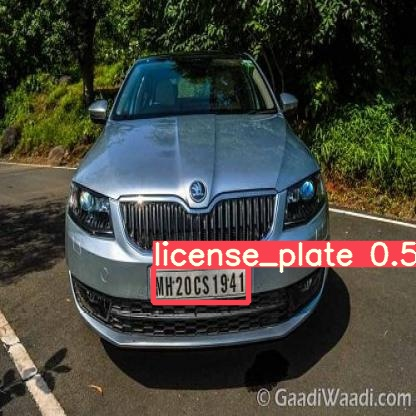

'/content/yolov5/runs/detect/exp3/5c85a40f-ce81-44b4-82b2-dfdac281217d___new_Skoda-Octavia-1-8-TSI-5_jpg.rf.cb49cc78b19d9f5608811d05b65f47ca.jpg'

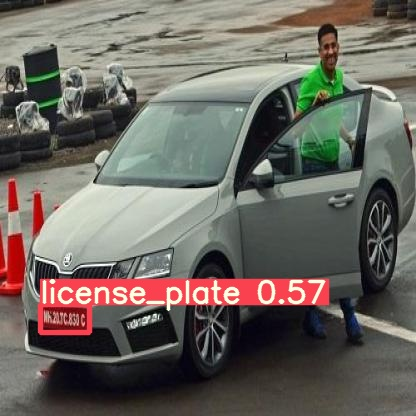

'/content/yolov5/runs/detect/exp3/84969111-2ec3-4914-b3bb-da5aaac701e7___1_jpg.rf.ee55bcc3736497417b4603e066b648cf.jpg'

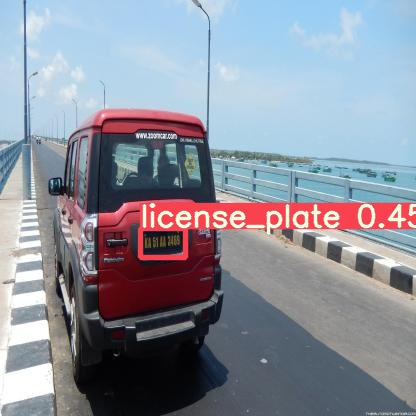

'/content/yolov5/runs/detect/exp3/cbd81ff4-fc2a-4cd5-bed6-0fef4c456caa___226616d1495986750-zoomcar-review-mahindra-scorpio-s4-09-pamban-jpg_jpeg.rf.a64355b7135242f7daa1e1e386b7c9f0.jpg'

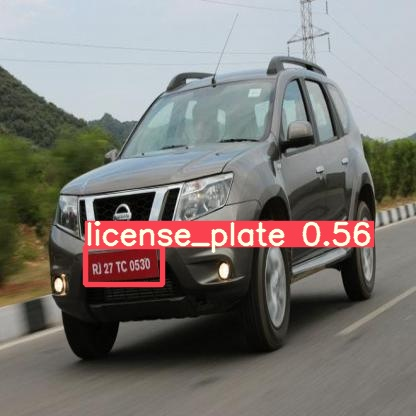

'/content/yolov5/runs/detect/exp3/65e2825e-943f-48a3-a4e2-7e81d649ace2___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_nissan-terrano-L.rf.8b04667b687e86fe5b6eb9f3683ce4b5.jpg'

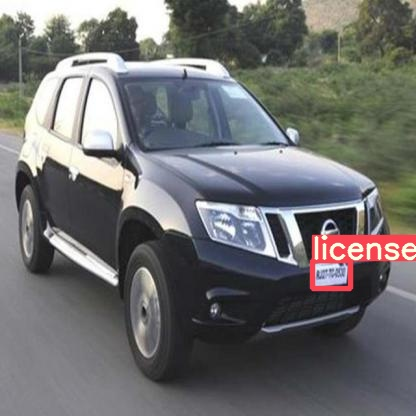

'/content/yolov5/runs/detect/exp3/b679ccb6-a48f-4315-a106-1b7b5a6e9fb7___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_1123691_Wallpaper2.rf.e832d0418128e0add5be155a66c75d3e.jpg'

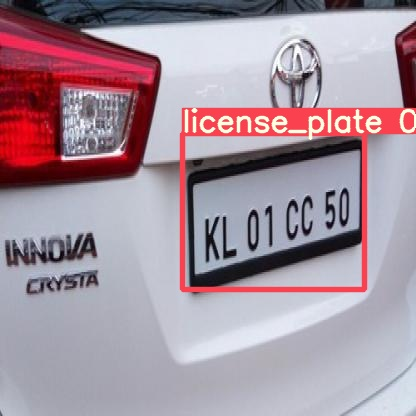

'/content/yolov5/runs/detect/exp3/62b58053-425c-4924-b129-c4a6580f3562___product-500x5001_jpeg.rf.5bc6e98574da5d8a53daee1a86db1753.jpg'

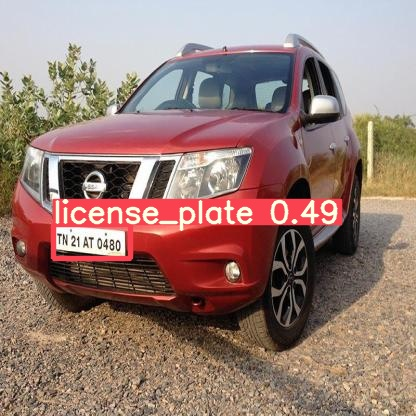

'/content/yolov5/runs/detect/exp3/0a720df9-e4ef-4e44-8c13-b39b9be8444d___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-6.rf.af31e798b2ade21ce53ff4245100999d.jpg'

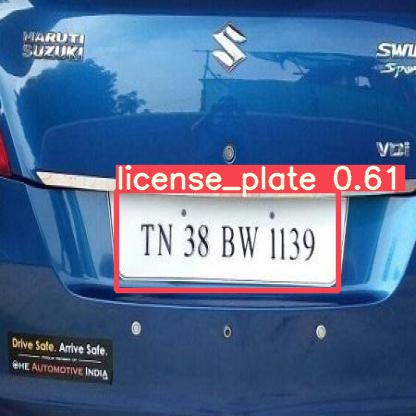

'/content/yolov5/runs/detect/exp3/e77e5db3-2bc6-4223-a258-2334256be65e___new_205356-maruti-swift-torque-blue-vdi-ddis-glistening-rockstar-enters-home-img_7531_jpg.rf.92f306e55a3f0f73c4388e790d3d7778.jpg'

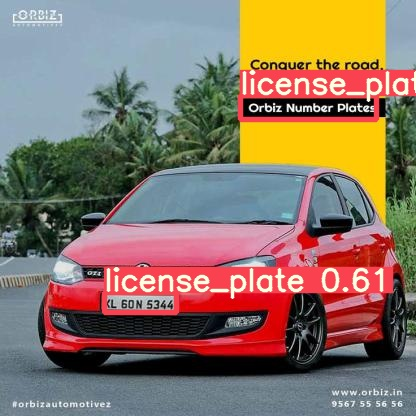

'/content/yolov5/runs/detect/exp3/85d7e25d-5aa1-4e5f-9c4e-4e671f14ddbe___77cca4b6f3864b3928824a030ba101d2-jpg_jpeg.rf.22eeba6aafe19cc29234ef23d4f11c53.jpg'

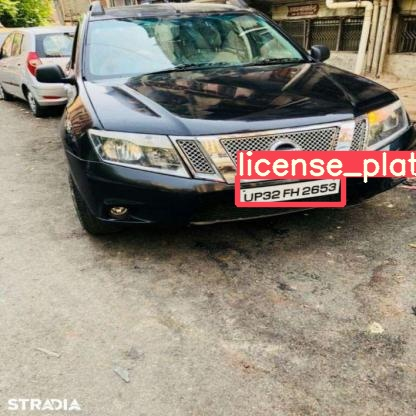

'/content/yolov5/runs/detect/exp3/e82fc408-a209-4221-9f6d-742b4b9d4c70___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_848803268_2_1080x720_nissan-terrano-xl-d-plus-2014-diesel-upload-photos.rf.2153f1c6245903a7a09375c5b192e53b.jpg'

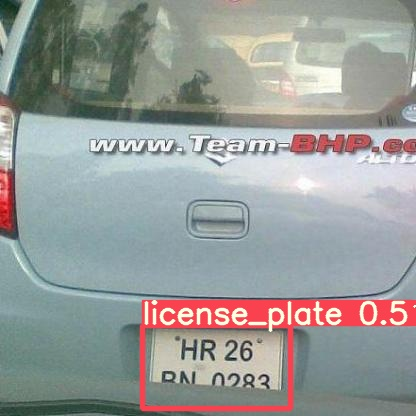

'/content/yolov5/runs/detect/exp3/50dfc8ce-e3e0-4856-aeba-2dcdf0fc2bec___Alto-Eco-India-rear-2_jpg.rf.a213a90f835d9dce477817f113a3c795.jpg'

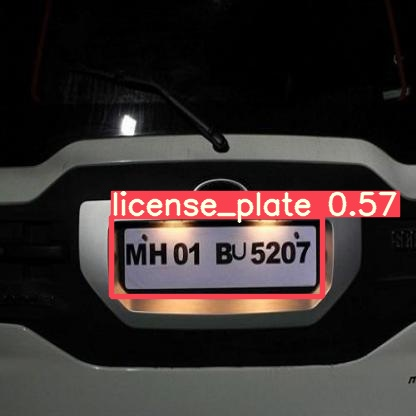

'/content/yolov5/runs/detect/exp3/7f369852-27b9-4141-8c48-9e88b20743a6___new_Mahindra-Scorpio-Taillamps-Night_JPG.rf.97388034ab56fe1855bb0f26fa68d3d8.jpg'

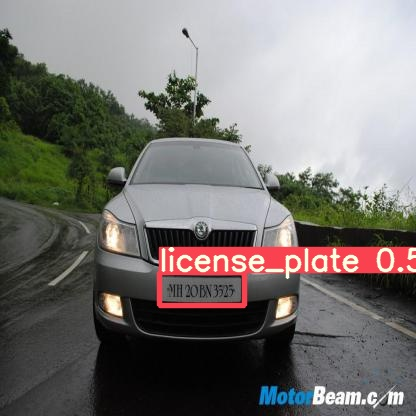

'/content/yolov5/runs/detect/exp3/c41652d9-19ae-4a7d-8423-230340ac30bc___Skoda_Laura_DSG_Long_Term_Review-125_jpg.rf.0e7e10fb59ee0216c8aa8e4ce6c9bce3.jpg'

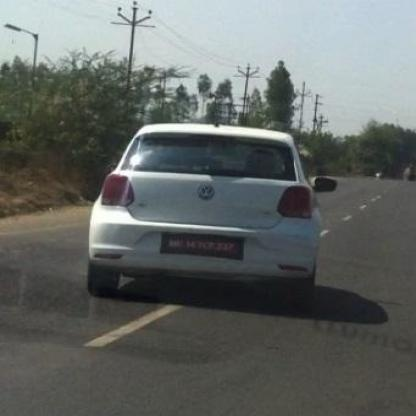

'/content/yolov5/runs/detect/exp3/e54fb93b-020f-4c55-b4db-86e17ba9b9e0___2014-VW-Polo-facelift-rear-spotted-testing-in-Pune-India_jpg.rf.c836459b9afcbcd348e25bd7e4e00af4.jpg'

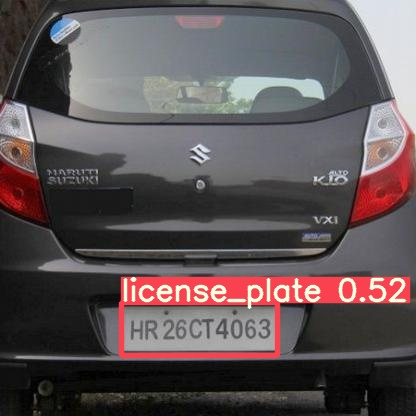

'/content/yolov5/runs/detect/exp3/41de2ad0-3785-488e-9f1f-75b76f446cc7___Maruti-Alto-K10-Photos-2-jpg_jpeg.rf.396405fe77dcde2ef64bc9d1dbebe1a3.jpg'

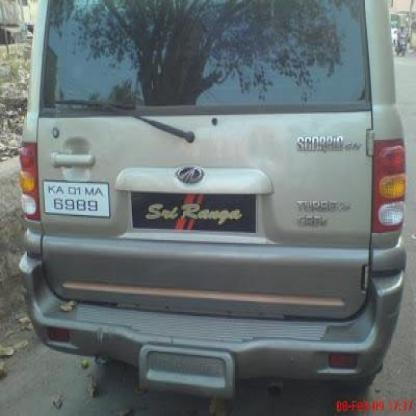

'/content/yolov5/runs/detect/exp3/165eaa92-8e90-44e6-b132-8af462bae0c9___scorpio-rear_JPG.rf.ba643217562c0194f8b08d717a1c9bb6.jpg'

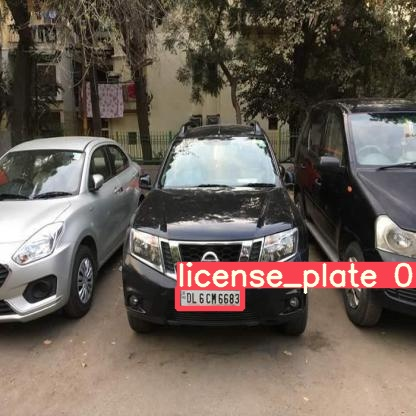

'/content/yolov5/runs/detect/exp3/a615016b-4d07-46c7-a52b-8d4319fe3a10___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_nissan-terrano-rear_view.rf.b877bb949e9c37e9d0e152a10e23ca0c.jpg'

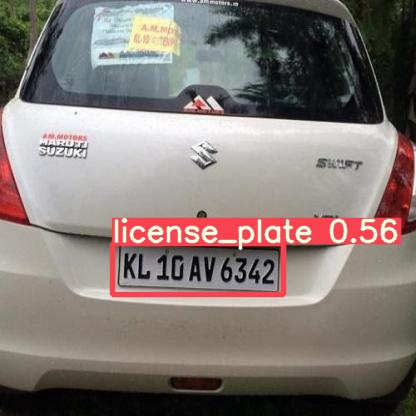

'/content/yolov5/runs/detect/exp3/5747d3e8-4dd0-435f-942d-34b84f03344c___Maruti-Suzuki-Swift-Number-Plates-Design_jpg.rf.467af986d590752b8e3b55a886059260.jpg'

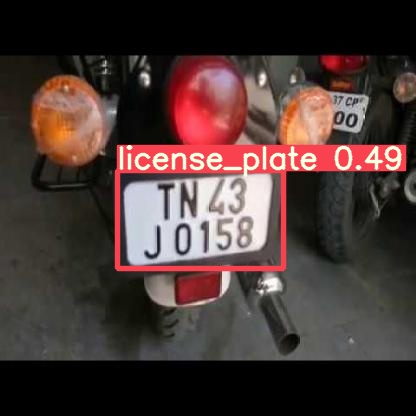

'/content/yolov5/runs/detect/exp3/074d85b8-42ec-4d17-9b8e-9e51ae060243___hqdefault_jpg.rf.726a97b8cff9c1dcc9fe0bdee081c11d.jpg'

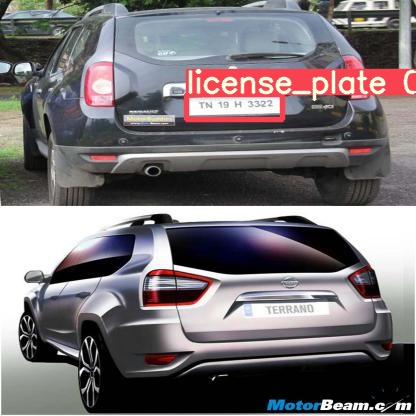

'/content/yolov5/runs/detect/exp3/2430703d-0fb3-4eb2-9765-4f9301f232cd___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Terrano-Duster-Rear-Comparison_jpg.rf.4c46439bf474318f6d2812ebad9ceee9.jpg'

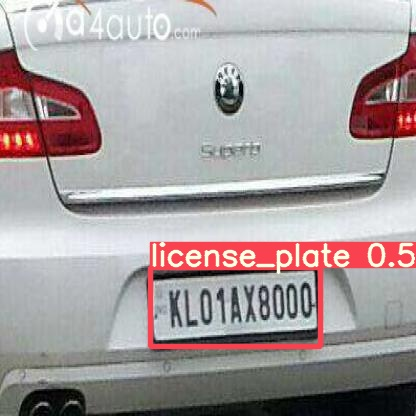

'/content/yolov5/runs/detect/exp3/4434b404-dd10-4150-b226-b76b6ef95e43___new_224489195_8_1000x700_skoda-superb-2010--jpg_jpeg.rf.225bcc47c327d2be8dac33f988857b39.jpg'

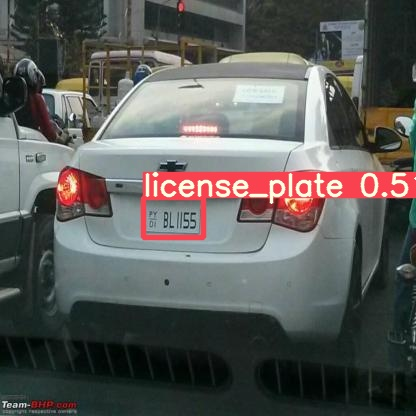

'/content/yolov5/runs/detect/exp3/f265077a-611f-4a18-abe5-46518b1756e6___1232700-take-look-number-plate-uploadfromtaptalk1398055489406-jpg_jpeg.rf.52fe4daff6a6c2a50eba0d15e89f5e97.jpg'

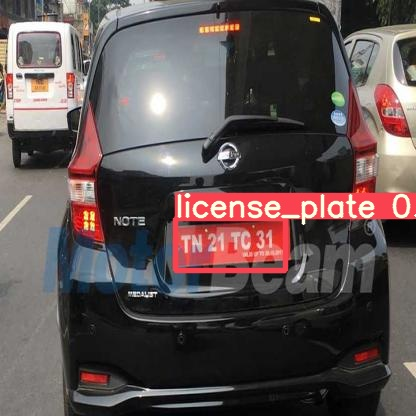

'/content/yolov5/runs/detect/exp3/cd506968-8676-4df3-9150-d1c2e618f4c2___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_nissan-note-india-testing_827x510_81508219864_jpg.rf.b1590fd043b6b13ad276934a03060f92.jpg'

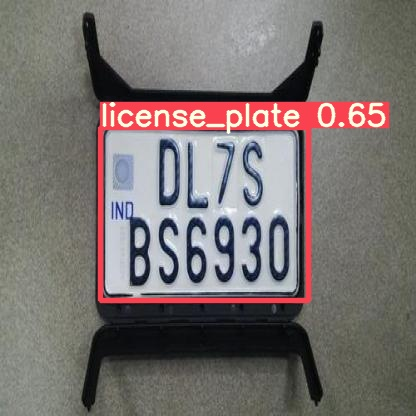

'/content/yolov5/runs/detect/exp3/e3f5fe39-d157-49fa-a0c9-b96ca1234a64___bike-scooter-number-plate-frame-rear-500x500_jpg.rf.676eedc4e1ff279563a307740e1bb408.jpg'

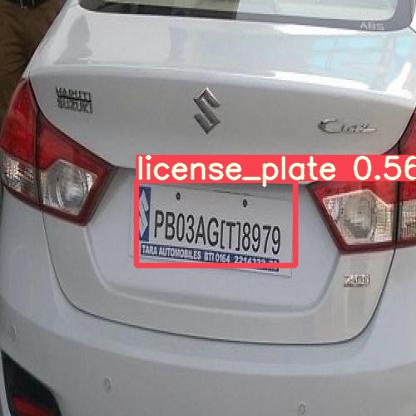

'/content/yolov5/runs/detect/exp3/931dfd5a-3d1f-4a08-9234-0453545e27ea___1297127d1412798792-maruti-ciaz-official-review-imag0627_jpg.rf.25664539c708610451af8ded11ad2de7.jpg'

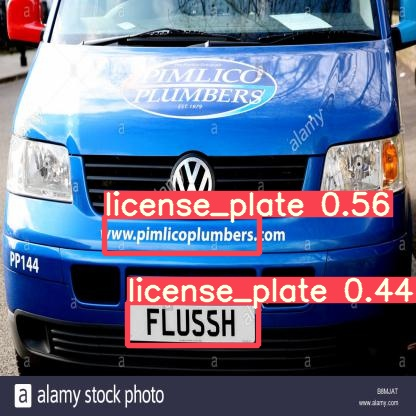

'/content/yolov5/runs/detect/exp3/ee7cffcb-cedd-444f-9d3b-42372ba30073___pimlico-plumbers-van-with-personalised-number-plate-london-B8MJAT-jpg_jpeg.rf.77e260817d0803eff4c36b7a4c7af9c0.jpg'

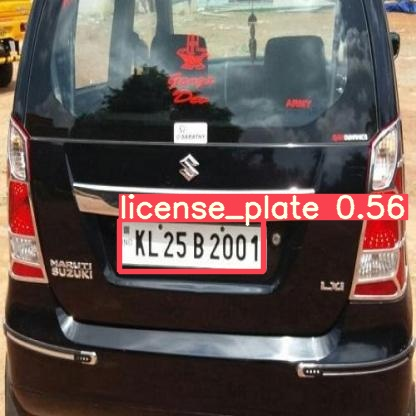

'/content/yolov5/runs/detect/exp3/dfebb432-82cd-4154-b919-0d8be2c0d85a___5e4697c6f639f3f341b2feb170d72795af3fc998_jpg.rf.1e4a85ce2d46a33046a8ce6e84c701fe.jpg'

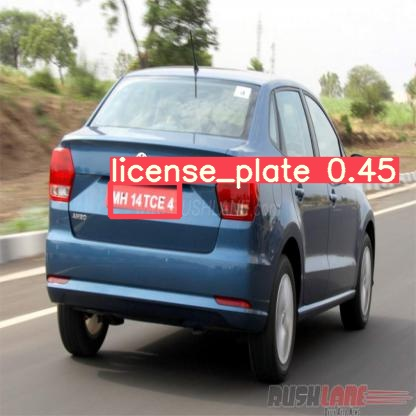

'/content/yolov5/runs/detect/exp3/85bd88a0-ac9a-412e-ba44-2a29d209e212___4336_1466054535_9-jpg_jpeg.rf.cefd6dd1ee161a073b878d957998ef4a.jpg'

In [22]:
import glob
from IPython.display import Image, display

for imagename in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'):
  display(Image(filename=imagename), imagename)
  print('\n')